# Regression Mini Project on Training Data Set

### Importing all the necessary modules

In [92]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt          
import datetime as dt 
import scipy.stats as stats
import statsmodels.formula.api as smf

### Importing the data from an external source into the Python environment

In [93]:
data = pd.read_excel('Training Data Set.xlsx')
data.head()

,Date,Year,Month,Customer Age,Customer Gender,Country,State,Product Category,Sub Category,Quantity,Unit Cost,Unit Price,Cost,Revenue
0,2016-02-19,2016,February,29,F,United States,Washington,Accessories,Tires and Tubes,1,80.00,109.000000,80,109
1,2016-02-20,2016,February,29,F,United States,Washington,Clothing,Gloves,2,24.50,28.500000,49,57
2,2016-02-27,2016,February,29,F,United States,Washington,Accessories,Tires and Tubes,3,3.67,5.000000,11,15
3,2016-03-12,2016,March,29,F,United States,Washington,Accessories,Tires and Tubes,2,87.50,116.500000,175,233
4,2016-03-12,2016,March,29,F,United States,Washington,Accessories,Tires and Tubes,3,35.00,41.666667,105,125


In [94]:
data.shape

(34866, 14)

In [95]:
data.head(3)

,Date,Year,Month,Customer Age,Customer Gender,Country,State,Product Category,Sub Category,Quantity,Unit Cost,Unit Price,Cost,Revenue
0,2016-02-19,2016,February,29,F,United States,Washington,Accessories,Tires and Tubes,1,80.00,109.0,80,109
1,2016-02-20,2016,February,29,F,United States,Washington,Clothing,Gloves,2,24.50,28.5,49,57
2,2016-02-27,2016,February,29,F,United States,Washington,Accessories,Tires and Tubes,3,3.67,5.0,11,15


### Renaming the variables as per the Naming conversion

In [96]:
data.columns

Index(['Date', 'Year', 'Month', 'Customer Age', 'Customer Gender', 'Country',
       'State', 'Product Category', 'Sub Category', 'Quantity', 'Unit Cost',
       'Unit Price', 'Cost', 'Revenue'],
      dtype='object')

In [97]:
data.columns = [i.replace(' ','_') for i in data.columns]
data.columns

Index(['Date', 'Year', 'Month', 'Customer_Age', 'Customer_Gender', 'Country',
       'State', 'Product_Category', 'Sub_Category', 'Quantity', 'Unit_Cost',
       'Unit_Price', 'Cost', 'Revenue'],
      dtype='object')

In [98]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34866 entries, 0 to 34865
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              34866 non-null  datetime64[ns]
 1   Year              34866 non-null  int64         
 2   Month             34866 non-null  object        
 3   Customer_Age      34866 non-null  int64         
 4   Customer_Gender   34866 non-null  object        
 5   Country           34866 non-null  object        
 6   State             34866 non-null  object        
 7   Product_Category  34866 non-null  object        
 8   Sub_Category      34866 non-null  object        
 9   Quantity          34866 non-null  int64         
 10  Unit_Cost         34866 non-null  float64       
 11  Unit_Price        34866 non-null  float64       
 12  Cost              34866 non-null  int64         
 13  Revenue           34866 non-null  int64         
dtypes: datetime64[ns](1), 

### Data Duplicacy: Chech if their is duplicate data or not

In [99]:
data.duplicated().sum()

1

In [100]:
data.drop_duplicates(inplace=True)

In [101]:
data.duplicated().sum()

0

In [102]:
data.isna().sum()

Date                0
Year                0
Month               0
Customer_Age        0
Customer_Gender     0
Country             0
State               0
Product_Category    0
Sub_Category        0
Quantity            0
Unit_Cost           0
Unit_Price          0
Cost                0
Revenue             0
dtype: int64

### Outlier Treatment

In [103]:
num_data = data.select_dtypes(['int','float'])

In [104]:
num_data 

,Year,Customer_Age,Quantity,Unit_Cost,Unit_Price,Cost,Revenue
0,2016,29,1,80.00,109.000000,80,109
1,2016,29,2,24.50,28.500000,49,57
2,2016,29,3,3.67,5.000000,11,15
3,2016,29,2,87.50,116.500000,175,233
4,2016,29,3,35.00,41.666667,105,125
5,2016,29,1,66.00,78.000000,66,78
6,2016,29,2,52.00,60.000000,104,120
7,2016,29,1,60.00,68.000000,60,68
8,2016,29,2,8.00,10.000000,16,20
9,2016,29,2,2.50,3.000000,5,6


In [105]:
cat_data = data.select_dtypes(['object'])

In [106]:
num_data['index'] = num_data.index


In [107]:
num_data.shape

(34865, 8)

In [108]:
cat_data['index'] = cat_data.index

In [109]:
cat_data.shape

(34865, 7)

In [110]:
cat_data.head()

,Month,Customer_Gender,Country,State,Product_Category,Sub_Category,index
0,February,F,United States,Washington,Accessories,Tires and Tubes,0
1,February,F,United States,Washington,Clothing,Gloves,1
2,February,F,United States,Washington,Accessories,Tires and Tubes,2
3,March,F,United States,Washington,Accessories,Tires and Tubes,3
4,March,F,United States,Washington,Accessories,Tires and Tubes,4


<Axes: >

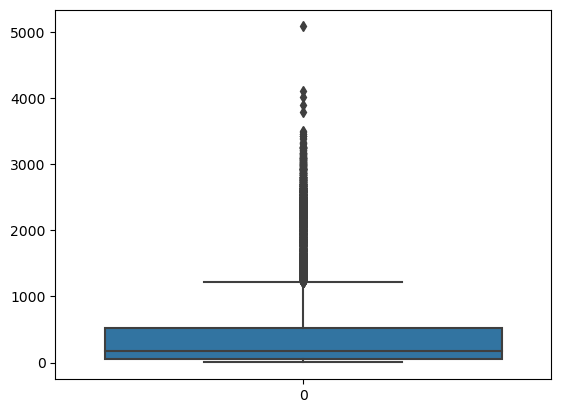

In [111]:
sns.boxplot(num_data.Unit_Price)

In [112]:
cat_data.Month.value_counts()

Month
June         3680
May          3676
December     3414
April        3283
March        3155
January      2907
February     2887
October      2554
November     2488
August       2303
September    2303
July         2215
Name: count, dtype: int64

In [113]:
cat_data.Month.nunique()

12

In [114]:
cat_data.Customer_Gender.value_counts()

Customer_Gender
M    17805
F    17060
Name: count, dtype: int64

In [115]:
cat_data.Customer_Gender.nunique()

2

In [116]:
cat_data.Country.value_counts()

Country
United States     18076
United Kingdom     6421
Germany            5200
France             5168
Name: count, dtype: int64

In [117]:
cat_data.Country.nunique()

4

In [118]:
cat_data.Product_Category.value_counts()

Product_Category
Accessories    22533
Bikes           7093
Clothing        5239
Name: count, dtype: int64

In [119]:
cat_data.Product_Category.nunique()

3

In [120]:
cat_data.Sub_Category.value_counts()

Sub_Category
Tires and Tubes      11112
Bottles and Cages     5294
Helmets               4176
Road Bikes            3022
Mountain Bikes        2737
Jerseys               2000
Caps                  1517
Touring Bikes         1334
Fenders                762
Shorts                 566
Cleaners               545
Gloves                 480
Hydration Packs        396
Socks                  364
Vests                  312
Bike Stands            145
Bike Racks             103
Name: count, dtype: int64

In [121]:
cat_data.Sub_Category.nunique()

17

<Axes: xlabel='Customer_Gender'>

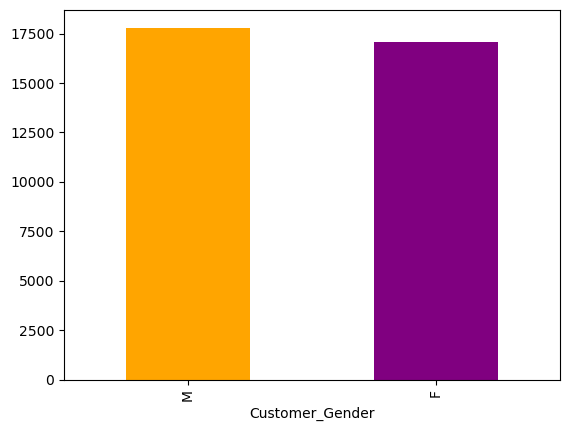

In [122]:
cat_data.Customer_Gender.value_counts().plot(kind = 'bar',color = ['orange','purple'])

<Axes: xlabel='Country'>

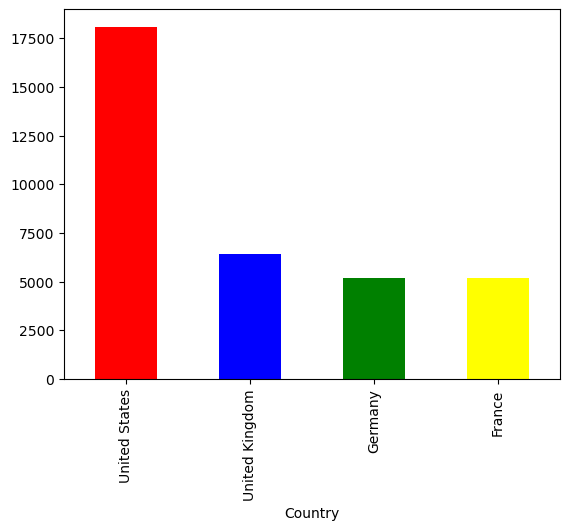

In [123]:
cat_data.Country.value_counts().plot(kind ='bar',color = ['red','blue','green','yellow'])

## One-hot encoding

In [124]:
cat_data.columns

Index(['Month', 'Customer_Gender', 'Country', 'State', 'Product_Category',
       'Sub_Category', 'index'],
      dtype='object')

In [125]:
cat_data.shape

(34865, 7)

In [126]:
cat_data = pd.get_dummies(cat_data,columns =['Customer_Gender','Country'],dtype=int)

In [127]:
cat_data.head()

,Month,State,Product_Category,Sub_Category,index,Customer_Gender_F,Customer_Gender_M,Country_France,Country_Germany,Country_United Kingdom,Country_United States
0,February,Washington,Accessories,Tires and Tubes,0,1,0,0,0,0,1
1,February,Washington,Clothing,Gloves,1,1,0,0,0,0,1
2,February,Washington,Accessories,Tires and Tubes,2,1,0,0,0,0,1
3,March,Washington,Accessories,Tires and Tubes,3,1,0,0,0,0,1
4,March,Washington,Accessories,Tires and Tubes,4,1,0,0,0,0,1


In [128]:
cat_data.shape

(34865, 11)

In [129]:
cat_data = pd.get_dummies(cat_data,columns = ['Month','State', 'Product_Category','Sub_Category'],dtype = int)

In [130]:
cat_data.head()

,index,Customer_Gender_F,Customer_Gender_M,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,State_Alabama,State_Arizona,State_Bayern,State_Brandenburg,State_California,State_Charente-Maritime,State_England,State_Essonne,State_Florida,State_Garonne (Haute),State_Georgia,State_Hamburg,State_Hauts de Seine,State_Hessen,State_Illinois,State_Kentucky,State_Loir et Cher,State_Loiret,State_Massachusetts,State_Minnesota,State_Mississippi,State_Missouri,State_Montana,State_Moselle,State_New York,State_Nord,State_Nordrhein-Westfalen,State_North Carolina,State_Ohio,State_Oregon,State_Pas de Calais,State_Saarland,State_Seine (Paris),State_Seine Saint Denis,State_Seine et Marne,State_Somme,State_South Carolina,State_Texas,State_Utah,State_Val d'Oise,State_Val de Marne,State_Virginia,State_Washington,State_Wyoming,State_Yveline,Product_Category_Accessories,Product_Category_Bikes,Product_Category_Clothing,Sub_Category_Bike Racks,Sub_Category_Bike Stands,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Cleaners,Sub_Category_Fenders,Sub_Category_Gloves,Sub_Category_Helmets,Sub_Category_Hydration Packs,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Socks,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Sub_Category_Vests
0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,2,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,3,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [131]:
cat_data.shape

(34865, 84)

## Merging the num_data and the cat_data

In [132]:
num_data.head()

,Year,Customer_Age,Quantity,Unit_Cost,Unit_Price,Cost,Revenue,index
0,2016,29,1,80.00,109.000000,80,109,0
1,2016,29,2,24.50,28.500000,49,57,1
2,2016,29,3,3.67,5.000000,11,15,2
3,2016,29,2,87.50,116.500000,175,233,3
4,2016,29,3,35.00,41.666667,105,125,4


In [133]:
num_data.shape

(34865, 8)

In [134]:
cat_data.head()

,index,Customer_Gender_F,Customer_Gender_M,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,State_Alabama,State_Arizona,State_Bayern,State_Brandenburg,State_California,State_Charente-Maritime,State_England,State_Essonne,State_Florida,State_Garonne (Haute),State_Georgia,State_Hamburg,State_Hauts de Seine,State_Hessen,State_Illinois,State_Kentucky,State_Loir et Cher,State_Loiret,State_Massachusetts,State_Minnesota,State_Mississippi,State_Missouri,State_Montana,State_Moselle,State_New York,State_Nord,State_Nordrhein-Westfalen,State_North Carolina,State_Ohio,State_Oregon,State_Pas de Calais,State_Saarland,State_Seine (Paris),State_Seine Saint Denis,State_Seine et Marne,State_Somme,State_South Carolina,State_Texas,State_Utah,State_Val d'Oise,State_Val de Marne,State_Virginia,State_Washington,State_Wyoming,State_Yveline,Product_Category_Accessories,Product_Category_Bikes,Product_Category_Clothing,Sub_Category_Bike Racks,Sub_Category_Bike Stands,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Cleaners,Sub_Category_Fenders,Sub_Category_Gloves,Sub_Category_Helmets,Sub_Category_Hydration Packs,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Socks,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Sub_Category_Vests
0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,2,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,3,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [135]:
cat_data.shape

(34865, 84)

In [136]:
final_data = pd.merge(num_data,cat_data,how = 'inner',left_on = 'index',right_on = 'index')

In [137]:
final_data.head()

,Year,Customer_Age,Quantity,Unit_Cost,Unit_Price,Cost,Revenue,index,Customer_Gender_F,Customer_Gender_M,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,State_Alabama,State_Arizona,State_Bayern,State_Brandenburg,State_California,State_Charente-Maritime,State_England,State_Essonne,State_Florida,State_Garonne (Haute),State_Georgia,State_Hamburg,State_Hauts de Seine,State_Hessen,State_Illinois,State_Kentucky,State_Loir et Cher,State_Loiret,State_Massachusetts,State_Minnesota,State_Mississippi,State_Missouri,State_Montana,State_Moselle,State_New York,State_Nord,State_Nordrhein-Westfalen,State_North Carolina,State_Ohio,State_Oregon,State_Pas de Calais,State_Saarland,State_Seine (Paris),State_Seine Saint Denis,State_Seine et Marne,State_Somme,State_South Carolina,State_Texas,State_Utah,State_Val d'Oise,State_Val de Marne,State_Virginia,State_Washington,State_Wyoming,State_Yveline,Product_Category_Accessories,Product_Category_Bikes,Product_Category_Clothing,Sub_Category_Bike Racks,Sub_Category_Bike Stands,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Cleaners,Sub_Category_Fenders,Sub_Category_Gloves,Sub_Category_Helmets,Sub_Category_Hydration Packs,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Socks,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Sub_Category_Vests
0,2016,29,1,80.00,109.000000,80,109,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,2016,29,2,24.50,28.500000,49,57,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,2016,29,3,3.67,5.000000,11,15,2,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,2016,29,2,87.50,116.500000,175,233,3,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,2016,29,3,35.00,41.666667,105,125,4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [138]:
final_data.shape

(34865, 91)

## Checking if the data is normally distributed or not

C:\Users\Siddhant\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


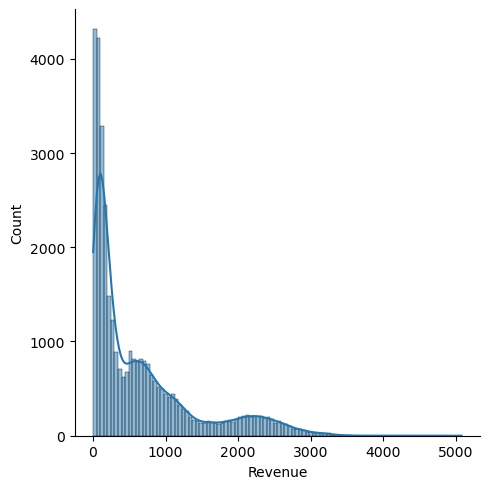

In [139]:
sns.displot(final_data.Revenue,kde = True)

C:\Users\Siddhant\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


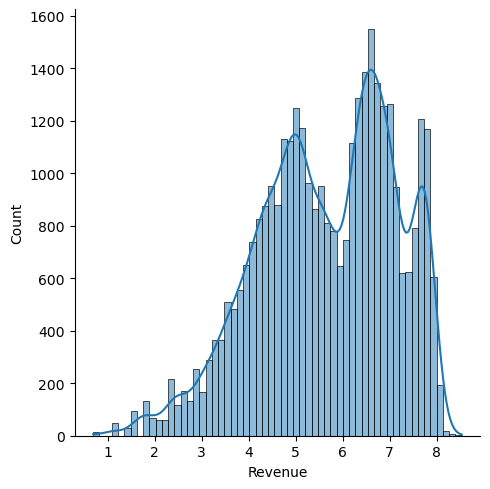

In [140]:
sns.displot(np.log(final_data.Revenue),kde = True)

C:\Users\Siddhant\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


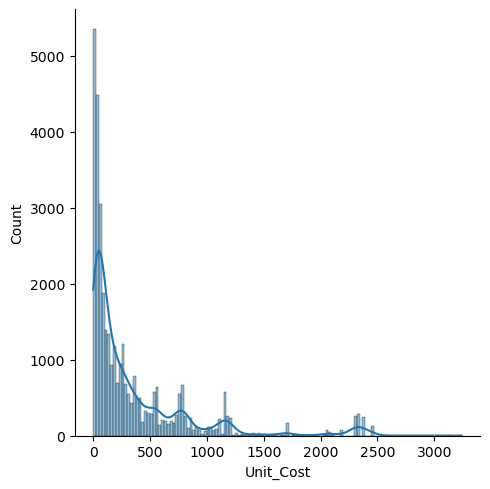

In [141]:
sns.displot(final_data.Unit_Cost,kde = True)

C:\Users\Siddhant\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


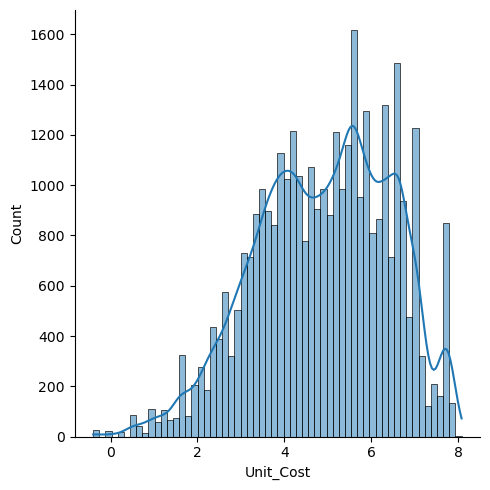

In [142]:
sns.displot(np.log(final_data.Unit_Cost),kde = True)

C:\Users\Siddhant\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


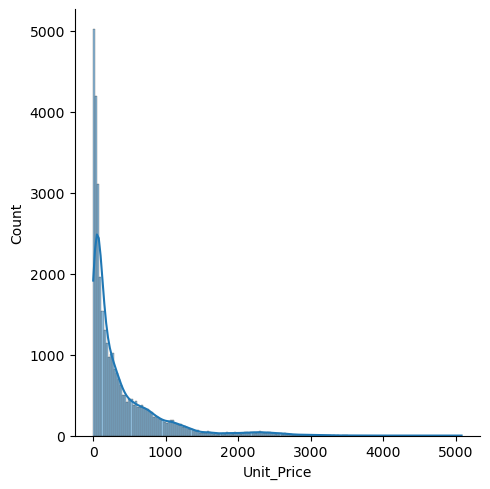

In [143]:
sns.displot(final_data.Unit_Price,kde = True)

C:\Users\Siddhant\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


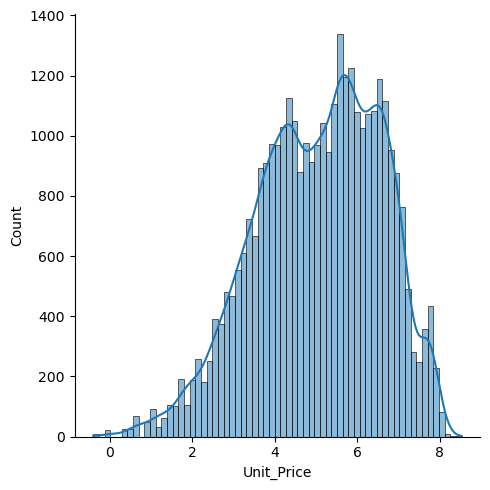

In [144]:
sns.displot(np.log(final_data.Unit_Price),kde = True)

C:\Users\Siddhant\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


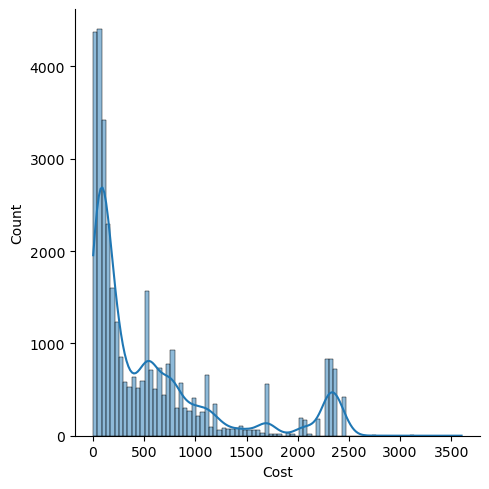

In [145]:
sns.displot(final_data.Cost,kde = True)

C:\Users\Siddhant\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


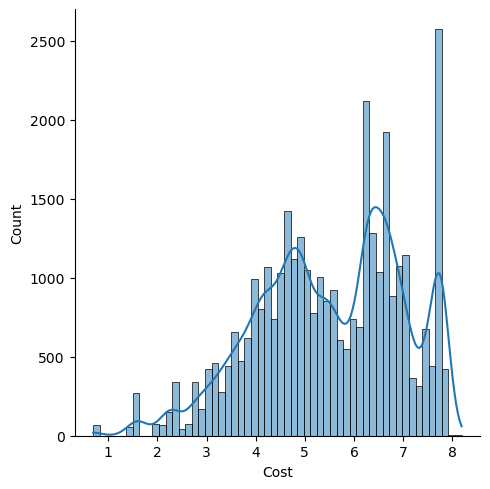

In [146]:
sns.displot(np.log(final_data.Cost),kde = True)

In [147]:
final_data.head()

,Year,Customer_Age,Quantity,Unit_Cost,Unit_Price,Cost,Revenue,index,Customer_Gender_F,Customer_Gender_M,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,State_Alabama,State_Arizona,State_Bayern,State_Brandenburg,State_California,State_Charente-Maritime,State_England,State_Essonne,State_Florida,State_Garonne (Haute),State_Georgia,State_Hamburg,State_Hauts de Seine,State_Hessen,State_Illinois,State_Kentucky,State_Loir et Cher,State_Loiret,State_Massachusetts,State_Minnesota,State_Mississippi,State_Missouri,State_Montana,State_Moselle,State_New York,State_Nord,State_Nordrhein-Westfalen,State_North Carolina,State_Ohio,State_Oregon,State_Pas de Calais,State_Saarland,State_Seine (Paris),State_Seine Saint Denis,State_Seine et Marne,State_Somme,State_South Carolina,State_Texas,State_Utah,State_Val d'Oise,State_Val de Marne,State_Virginia,State_Washington,State_Wyoming,State_Yveline,Product_Category_Accessories,Product_Category_Bikes,Product_Category_Clothing,Sub_Category_Bike Racks,Sub_Category_Bike Stands,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Cleaners,Sub_Category_Fenders,Sub_Category_Gloves,Sub_Category_Helmets,Sub_Category_Hydration Packs,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Socks,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Sub_Category_Vests
0,2016,29,1,80.00,109.000000,80,109,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,2016,29,2,24.50,28.500000,49,57,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,2016,29,3,3.67,5.000000,11,15,2,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,2016,29,2,87.50,116.500000,175,233,3,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,2016,29,3,35.00,41.666667,105,125,4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [148]:
final_data_copy = final_data.copy()

In [149]:
final_data_copy['log_rev'] = np.log(final_data_copy['Revenue'])

In [150]:
final_data_copy.head()

,Year,Customer_Age,Quantity,Unit_Cost,Unit_Price,Cost,Revenue,index,Customer_Gender_F,Customer_Gender_M,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,State_Alabama,State_Arizona,State_Bayern,State_Brandenburg,State_California,State_Charente-Maritime,State_England,State_Essonne,State_Florida,State_Garonne (Haute),State_Georgia,State_Hamburg,State_Hauts de Seine,State_Hessen,State_Illinois,State_Kentucky,State_Loir et Cher,State_Loiret,State_Massachusetts,State_Minnesota,State_Mississippi,State_Missouri,State_Montana,State_Moselle,State_New York,State_Nord,State_Nordrhein-Westfalen,State_North Carolina,State_Ohio,State_Oregon,State_Pas de Calais,State_Saarland,State_Seine (Paris),State_Seine Saint Denis,State_Seine et Marne,State_Somme,State_South Carolina,State_Texas,State_Utah,State_Val d'Oise,State_Val de Marne,State_Virginia,State_Washington,State_Wyoming,State_Yveline,Product_Category_Accessories,Product_Category_Bikes,Product_Category_Clothing,Sub_Category_Bike Racks,Sub_Category_Bike Stands,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Cleaners,Sub_Category_Fenders,Sub_Category_Gloves,Sub_Category_Helmets,Sub_Category_Hydration Packs,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Socks,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Sub_Category_Vests,log_rev
0,2016,29,1,80.00,109.000000,80,109,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.691348
1,2016,29,2,24.50,28.500000,49,57,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4.043051
2,2016,29,3,3.67,5.000000,11,15,2,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2.708050
3,2016,29,2,87.50,116.500000,175,233,3,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,5.451038
4,2016,29,3,35.00,41.666667,105,125,4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.828314


In [151]:
final_data_copy = final_data_copy.drop(columns='Revenue')

In [152]:
final_data_copy.head()

,Year,Customer_Age,Quantity,Unit_Cost,Unit_Price,Cost,index,Customer_Gender_F,Customer_Gender_M,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,State_Alabama,State_Arizona,State_Bayern,State_Brandenburg,State_California,State_Charente-Maritime,State_England,State_Essonne,State_Florida,State_Garonne (Haute),State_Georgia,State_Hamburg,State_Hauts de Seine,State_Hessen,State_Illinois,State_Kentucky,State_Loir et Cher,State_Loiret,State_Massachusetts,State_Minnesota,State_Mississippi,State_Missouri,State_Montana,State_Moselle,State_New York,State_Nord,State_Nordrhein-Westfalen,State_North Carolina,State_Ohio,State_Oregon,State_Pas de Calais,State_Saarland,State_Seine (Paris),State_Seine Saint Denis,State_Seine et Marne,State_Somme,State_South Carolina,State_Texas,State_Utah,State_Val d'Oise,State_Val de Marne,State_Virginia,State_Washington,State_Wyoming,State_Yveline,Product_Category_Accessories,Product_Category_Bikes,Product_Category_Clothing,Sub_Category_Bike Racks,Sub_Category_Bike Stands,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Cleaners,Sub_Category_Fenders,Sub_Category_Gloves,Sub_Category_Helmets,Sub_Category_Hydration Packs,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Socks,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Sub_Category_Vests,log_rev
0,2016,29,1,80.00,109.000000,80,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.691348
1,2016,29,2,24.50,28.500000,49,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4.043051
2,2016,29,3,3.67,5.000000,11,2,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2.708050
3,2016,29,2,87.50,116.500000,175,3,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,5.451038
4,2016,29,3,35.00,41.666667,105,4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.828314


In [153]:
final_data_copy['log_uc'] = np.log(final_data_copy['Unit_Cost'])

In [154]:
final_data_copy['log_up'] = np.log(final_data_copy['Unit_Price'])

In [155]:
final_data_copy['log_Cost'] = np.log(final_data_copy['Cost'])

In [156]:
final_data_copy.head()

,Year,Customer_Age,Quantity,Unit_Cost,Unit_Price,Cost,index,Customer_Gender_F,Customer_Gender_M,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,State_Alabama,State_Arizona,State_Bayern,State_Brandenburg,State_California,State_Charente-Maritime,State_England,State_Essonne,State_Florida,State_Garonne (Haute),State_Georgia,State_Hamburg,State_Hauts de Seine,State_Hessen,State_Illinois,State_Kentucky,State_Loir et Cher,State_Loiret,State_Massachusetts,State_Minnesota,State_Mississippi,State_Missouri,State_Montana,State_Moselle,State_New York,State_Nord,State_Nordrhein-Westfalen,State_North Carolina,State_Ohio,State_Oregon,State_Pas de Calais,State_Saarland,State_Seine (Paris),State_Seine Saint Denis,State_Seine et Marne,State_Somme,State_South Carolina,State_Texas,State_Utah,State_Val d'Oise,State_Val de Marne,State_Virginia,State_Washington,State_Wyoming,State_Yveline,Product_Category_Accessories,Product_Category_Bikes,Product_Category_Clothing,Sub_Category_Bike Racks,Sub_Category_Bike Stands,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Cleaners,Sub_Category_Fenders,Sub_Category_Gloves,Sub_Category_Helmets,Sub_Category_Hydration Packs,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Socks,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Sub_Category_Vests,log_rev,log_uc,log_up,log_Cost
0,2016,29,1,80.00,109.000000,80,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.691348,4.382027,4.691348,4.382027
1,2016,29,2,24.50,28.500000,49,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4.043051,3.198673,3.349904,3.891820
2,2016,29,3,3.67,5.000000,11,2,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2.708050,1.300192,1.609438,2.397895
3,2016,29,2,87.50,116.500000,175,3,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,5.451038,4.471639,4.757891,5.164786
4,2016,29,3,35.00,41.666667,105,4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.828314,3.555348,3.729701,4.653960


In [157]:
final_data_copy = final_data_copy.drop(columns='Unit_Cost')

In [158]:
final_data_copy = final_data_copy.drop(columns='Unit_Price')

In [159]:
final_data_copy = final_data_copy.drop(columns='Cost')

In [160]:
final_data_copy.head()

,Year,Customer_Age,Quantity,index,Customer_Gender_F,Customer_Gender_M,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,State_Alabama,State_Arizona,State_Bayern,State_Brandenburg,State_California,State_Charente-Maritime,State_England,State_Essonne,State_Florida,State_Garonne (Haute),State_Georgia,State_Hamburg,State_Hauts de Seine,State_Hessen,State_Illinois,State_Kentucky,State_Loir et Cher,State_Loiret,State_Massachusetts,State_Minnesota,State_Mississippi,State_Missouri,State_Montana,State_Moselle,State_New York,State_Nord,State_Nordrhein-Westfalen,State_North Carolina,State_Ohio,State_Oregon,State_Pas de Calais,State_Saarland,State_Seine (Paris),State_Seine Saint Denis,State_Seine et Marne,State_Somme,State_South Carolina,State_Texas,State_Utah,State_Val d'Oise,State_Val de Marne,State_Virginia,State_Washington,State_Wyoming,State_Yveline,Product_Category_Accessories,Product_Category_Bikes,Product_Category_Clothing,Sub_Category_Bike Racks,Sub_Category_Bike Stands,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Cleaners,Sub_Category_Fenders,Sub_Category_Gloves,Sub_Category_Helmets,Sub_Category_Hydration Packs,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Socks,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Sub_Category_Vests,log_rev,log_uc,log_up,log_Cost
0,2016,29,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.691348,4.382027,4.691348,4.382027
1,2016,29,2,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4.043051,3.198673,3.349904,3.891820
2,2016,29,3,2,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2.708050,1.300192,1.609438,2.397895
3,2016,29,2,3,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,5.451038,4.471639,4.757891,5.164786
4,2016,29,3,4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.828314,3.555348,3.729701,4.653960


In [161]:
final_data.head()

,Year,Customer_Age,Quantity,Unit_Cost,Unit_Price,Cost,Revenue,index,Customer_Gender_F,Customer_Gender_M,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,State_Alabama,State_Arizona,State_Bayern,State_Brandenburg,State_California,State_Charente-Maritime,State_England,State_Essonne,State_Florida,State_Garonne (Haute),State_Georgia,State_Hamburg,State_Hauts de Seine,State_Hessen,State_Illinois,State_Kentucky,State_Loir et Cher,State_Loiret,State_Massachusetts,State_Minnesota,State_Mississippi,State_Missouri,State_Montana,State_Moselle,State_New York,State_Nord,State_Nordrhein-Westfalen,State_North Carolina,State_Ohio,State_Oregon,State_Pas de Calais,State_Saarland,State_Seine (Paris),State_Seine Saint Denis,State_Seine et Marne,State_Somme,State_South Carolina,State_Texas,State_Utah,State_Val d'Oise,State_Val de Marne,State_Virginia,State_Washington,State_Wyoming,State_Yveline,Product_Category_Accessories,Product_Category_Bikes,Product_Category_Clothing,Sub_Category_Bike Racks,Sub_Category_Bike Stands,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Cleaners,Sub_Category_Fenders,Sub_Category_Gloves,Sub_Category_Helmets,Sub_Category_Hydration Packs,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Socks,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Sub_Category_Vests
0,2016,29,1,80.00,109.000000,80,109,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,2016,29,2,24.50,28.500000,49,57,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,2016,29,3,3.67,5.000000,11,15,2,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,2016,29,2,87.50,116.500000,175,233,3,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,2016,29,3,35.00,41.666667,105,125,4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


## Feature Engineering

### Correlation Analysis

In [162]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [163]:
final_data = final_data.drop(columns = 'index')

In [164]:
corr = final_data.corrwith(final_data.Revenue).abs().sort_values(ascending = False)

In [165]:
corr

Revenue                           1.000000
Cost                              0.979119
Unit_Price                        0.851031
Unit_Cost                         0.836954
Product_Category_Bikes            0.671301
Product_Category_Accessories      0.571720
Sub_Category_Mountain Bikes       0.495436
Sub_Category_Tires and Tubes      0.355591
Sub_Category_Touring Bikes        0.311153
Sub_Category_Bottles and Cages    0.291150
Sub_Category_Road Bikes           0.274725
Sub_Category_Caps                 0.136701
Sub_Category_Shorts               0.100577
Country_Germany                   0.099667
Country_United States             0.094052
Sub_Category_Jerseys              0.092483
Sub_Category_Cleaners             0.083618
Sub_Category_Vests                0.069759
Sub_Category_Socks                0.065905
Sub_Category_Hydration Packs      0.054926
Sub_Category_Bike Racks           0.053693
State_Washington                  0.050444
State_Saarland                    0.047707
State_Calif

In [166]:
v = corr[np.abs(corr)>0.09].index.difference(['Revenue'])

In [167]:
v

Index(['Cost', 'Country_Germany', 'Country_United States',
       'Product_Category_Accessories', 'Product_Category_Bikes',
       'Sub_Category_Bottles and Cages', 'Sub_Category_Caps',
       'Sub_Category_Jerseys', 'Sub_Category_Mountain Bikes',
       'Sub_Category_Road Bikes', 'Sub_Category_Shorts',
       'Sub_Category_Tires and Tubes', 'Sub_Category_Touring Bikes',
       'Unit_Cost', 'Unit_Price'],
      dtype='object')

In [168]:
final_data_2 = final_data.loc[ : : ,['Cost', 'Country_Germany', 'Country_United States','Product_Category_Accessories', 'Product_Category_Bikes','Sub_Category_Bottles and Cages', 'Sub_Category_Caps','Sub_Category_Jerseys', 'Sub_Category_Mountain Bikes','Sub_Category_Road Bikes', 'Sub_Category_Shorts','Sub_Category_Tires and Tubes', 'Sub_Category_Touring Bikes','Unit_Cost', 'Unit_Price']]

In [169]:
final_data_2.head()

,Cost,Country_Germany,Country_United States,Product_Category_Accessories,Product_Category_Bikes,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Unit_Cost,Unit_Price
0,80,0,1,1,0,0,0,0,0,0,0,1,0,80.00,109.000000
1,49,0,1,0,0,0,0,0,0,0,0,0,0,24.50,28.500000
2,11,0,1,1,0,0,0,0,0,0,0,1,0,3.67,5.000000
3,175,0,1,1,0,0,0,0,0,0,0,1,0,87.50,116.500000
4,105,0,1,1,0,0,0,0,0,0,0,1,0,35.00,41.666667


In [170]:
final_data_2.shape

(34865, 15)

In [171]:
final_data_2.columns=[i.replace(' ','_')for i in final_data_2.columns ]

In [172]:
final_data_2.columns

Index(['Cost', 'Country_Germany', 'Country_United_States',
       'Product_Category_Accessories', 'Product_Category_Bikes',
       'Sub_Category_Bottles_and_Cages', 'Sub_Category_Caps',
       'Sub_Category_Jerseys', 'Sub_Category_Mountain_Bikes',
       'Sub_Category_Road_Bikes', 'Sub_Category_Shorts',
       'Sub_Category_Tires_and_Tubes', 'Sub_Category_Touring_Bikes',
       'Unit_Cost', 'Unit_Price'],
      dtype='object')

In [173]:
final_data_2.head()

,Cost,Country_Germany,Country_United_States,Product_Category_Accessories,Product_Category_Bikes,Sub_Category_Bottles_and_Cages,Sub_Category_Caps,Sub_Category_Jerseys,Sub_Category_Mountain_Bikes,Sub_Category_Road_Bikes,Sub_Category_Shorts,Sub_Category_Tires_and_Tubes,Sub_Category_Touring_Bikes,Unit_Cost,Unit_Price
0,80,0,1,1,0,0,0,0,0,0,0,1,0,80.00,109.000000
1,49,0,1,0,0,0,0,0,0,0,0,0,0,24.50,28.500000
2,11,0,1,1,0,0,0,0,0,0,0,1,0,3.67,5.000000
3,175,0,1,1,0,0,0,0,0,0,0,1,0,87.50,116.500000
4,105,0,1,1,0,0,0,0,0,0,0,1,0,35.00,41.666667


### Now whatever Feature Engineering we have done for the final data, we will do the same for final_data_copy.

In [174]:
final_data_copy.head(2)

,Year,Customer_Age,Quantity,index,Customer_Gender_F,Customer_Gender_M,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,State_Alabama,State_Arizona,State_Bayern,State_Brandenburg,State_California,State_Charente-Maritime,State_England,State_Essonne,State_Florida,State_Garonne (Haute),State_Georgia,State_Hamburg,State_Hauts de Seine,State_Hessen,State_Illinois,State_Kentucky,State_Loir et Cher,State_Loiret,State_Massachusetts,State_Minnesota,State_Mississippi,State_Missouri,State_Montana,State_Moselle,State_New York,State_Nord,State_Nordrhein-Westfalen,State_North Carolina,State_Ohio,State_Oregon,State_Pas de Calais,State_Saarland,State_Seine (Paris),State_Seine Saint Denis,State_Seine et Marne,State_Somme,State_South Carolina,State_Texas,State_Utah,State_Val d'Oise,State_Val de Marne,State_Virginia,State_Washington,State_Wyoming,State_Yveline,Product_Category_Accessories,Product_Category_Bikes,Product_Category_Clothing,Sub_Category_Bike Racks,Sub_Category_Bike Stands,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Cleaners,Sub_Category_Fenders,Sub_Category_Gloves,Sub_Category_Helmets,Sub_Category_Hydration Packs,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Socks,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Sub_Category_Vests,log_rev,log_uc,log_up,log_Cost
0,2016,29,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.691348,4.382027,4.691348,4.382027
1,2016,29,2,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4.043051,3.198673,3.349904,3.891820


In [175]:
corr2 = final_data_copy.corrwith(final_data_copy.log_rev).abs().sort_values(ascending = False)
corr2

log_rev                           1.000000
log_Cost                          0.994874
log_up                            0.954347
log_uc                            0.951253
Product_Category_Bikes            0.549326
Product_Category_Accessories      0.520417
Sub_Category_Tires and Tubes      0.405093
Sub_Category_Mountain Bikes       0.354248
Sub_Category_Bottles and Cages    0.313683
Sub_Category_Road Bikes           0.287113
Sub_Category_Touring Bikes        0.234972
Sub_Category_Jerseys              0.147743
Sub_Category_Helmets              0.142365
Sub_Category_Caps                 0.115426
Sub_Category_Shorts               0.103767
Product_Category_Clothing         0.077479
Sub_Category_Vests                0.076255
Sub_Category_Cleaners             0.075522
Country_Germany                   0.075154
Sub_Category_Hydration Packs      0.074524
Country_United States             0.072431
index                             0.071367
Sub_Category_Socks                0.054987
Sub_Categor

In [176]:
final_data_copy = final_data_copy.drop(columns = 'index')

**We are taking a cut-off of 0.07 as per looking at the correlation values and we wanted at max 25 variables as per the data.**

In [177]:
w = corr2[np.abs(corr2)>0.07].index.difference(['log_rev'])
w

Index(['Country_Germany', 'Country_United States',
       'Product_Category_Accessories', 'Product_Category_Bikes',
       'Product_Category_Clothing', 'Sub_Category_Bottles and Cages',
       'Sub_Category_Caps', 'Sub_Category_Cleaners', 'Sub_Category_Helmets',
       'Sub_Category_Hydration Packs', 'Sub_Category_Jerseys',
       'Sub_Category_Mountain Bikes', 'Sub_Category_Road Bikes',
       'Sub_Category_Shorts', 'Sub_Category_Tires and Tubes',
       'Sub_Category_Touring Bikes', 'Sub_Category_Vests', 'index', 'log_Cost',
       'log_uc', 'log_up'],
      dtype='object')

In [178]:
fd_copy2 = final_data_copy.loc[ : : ,['Country_Germany', 'Country_United States','Product_Category_Accessories', 'Product_Category_Bikes','Product_Category_Clothing', 'Sub_Category_Bottles and Cages','Sub_Category_Caps', 'Sub_Category_Cleaners', 'Sub_Category_Helmets','Sub_Category_Hydration Packs', 'Sub_Category_Jerseys','Sub_Category_Mountain Bikes', 'Sub_Category_Road Bikes','Sub_Category_Shorts', 'Sub_Category_Tires and Tubes','Sub_Category_Touring Bikes', 'Sub_Category_Vests', 'log_Cost','log_uc', 'log_up']]

In [179]:
fd_copy2.head(3)

,Country_Germany,Country_United States,Product_Category_Accessories,Product_Category_Bikes,Product_Category_Clothing,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Cleaners,Sub_Category_Helmets,Sub_Category_Hydration Packs,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Sub_Category_Vests,log_Cost,log_uc,log_up
0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.382027,4.382027,4.691348
1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,3.891820,3.198673,3.349904
2,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2.397895,1.300192,1.609438


In [180]:
fd_copy2.shape

(34865, 20)

In [181]:
fd_copy2.columns=[i.replace(' ','_')for i in fd_copy2.columns]

In [182]:
fd_copy2.columns

Index(['Country_Germany', 'Country_United_States',
       'Product_Category_Accessories', 'Product_Category_Bikes',
       'Product_Category_Clothing', 'Sub_Category_Bottles_and_Cages',
       'Sub_Category_Caps', 'Sub_Category_Cleaners', 'Sub_Category_Helmets',
       'Sub_Category_Hydration_Packs', 'Sub_Category_Jerseys',
       'Sub_Category_Mountain_Bikes', 'Sub_Category_Road_Bikes',
       'Sub_Category_Shorts', 'Sub_Category_Tires_and_Tubes',
       'Sub_Category_Touring_Bikes', 'Sub_Category_Vests', 'log_Cost',
       'log_uc', 'log_up'],
      dtype='object')

## Splitting the final dataset into Training and Testing dataset

In [343]:
!pip install scikit-learn

Defaulting to user installation because normal site-packages is not writeable


In [183]:
import sklearn

In [184]:
from sklearn.model_selection import train_test_split

In [185]:
final_data_2['Revenue'] = final_data['Revenue']

In [186]:
train,test = train_test_split(final_data_2,test_size = 0.3, random_state = 123)

In [187]:
train.shape

(24405, 16)

In [188]:
test.shape

(10460, 16)

In [ ]:
#Just do train-test split for the new data.

In [190]:
fd_copy2['log_Revenue'] = final_data_copy['log_rev']

In [191]:
log_train,log_test = train_test_split(fd_copy2,test_size = 0.3, random_state = 123)

In [192]:
log_train.shape

(24405, 21)

In [193]:
log_test.shape

(10460, 21)

## Building the Regression model

In [350]:
formula = 'Revenue~' + '+'.join(train.columns.difference(['Revenue']))

In [351]:
formula2 = 'Revenue~' + '+'.join(train.columns.difference(['Revenue','Product_Category_Accessories']))

In [352]:
form3 = 'Revenue~' + '+'.join(train.columns.difference(['Revenue','Product_Category_Accessories','Sub_Category_Shorts']))

In [353]:
form4 = 'Revenue~' + '+'.join(train.columns.difference(['Revenue','Product_Category_Accessories','Sub_Category_Shorts','Sub_Category_Jerseys']))

In [354]:
from sklearn import datasets, linear_model

In [355]:
formula 

'Revenue~Cost+Country_Germany+Country_United_States+Product_Category_Accessories+Product_Category_Bikes+Sub_Category_Bottles_and_Cages+Sub_Category_Caps+Sub_Category_Jerseys+Sub_Category_Mountain_Bikes+Sub_Category_Road_Bikes+Sub_Category_Shorts+Sub_Category_Tires_and_Tubes+Sub_Category_Touring_Bikes+Unit_Cost+Unit_Price'

In [356]:
model = smf.ols(form4, train).fit()

In [357]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                Revenue   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                 3.150e+05
Date:                Thu, 23 May 2024   Prob (F-statistic):               0.00
Time:                        13:03:08   Log-Likelihood:            -1.3520e+05
No. Observations:               24405   AIC:                         2.704e+05
Df Residuals:                   24393   BIC:                         2.705e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

In [358]:
pred_Revenue = model.predict(train)
pred_Revenue

5858      162.568496
2839     2308.953804
1188       91.252414
7144      544.185137
30585     157.412994
3745     1118.906421
10182     101.454413
27770     117.031752
7266     2021.608158
29410     319.888549
22362    1695.732201
26692     678.528721
34751      70.626739
24810     107.856922
11594     631.007111
28422      75.232500
14150    2466.680546
13682      40.521191
22402     999.770009
23667     343.009220
961       241.725145
27876    2856.147850
3124      249.630789
3609      514.986893
30936     208.127089
21746     565.557487
29281     709.223483
28206    2442.477783
28632     243.113025
25235     829.873859
5054      797.251606
24277      40.328345
7830     1860.096764
33558      96.342717
20718     160.742569
16437     179.094092
5609       82.181625
7578      274.237284
19448     667.809448
18837    1854.038160
7450      247.469871
14194      52.583511
25452     139.285423
11159     418.540142
13070     584.496994
9917     1563.606986
15158     486.941714
28167     974

In [359]:
train['Revenue']

5858      162
2839     2109
1188       73
7144      555
30585     148
3745     1224
10182      95
27770     124
7266     2261
29410     360
22362    1559
26692     725
34751      71
24810     106
11594     633
28422      85
14150    2485
13682      47
22402     990
23667     387
961       214
27876    2809
3124      254
3609      510
30936     196
21746     622
29281     684
28206    2328
28632     202
25235     855
5054      791
24277      43
7830     2002
33558      83
20718     148
16437     179
5609       79
7578      269
19448     628
18837    1763
7450      227
14194      56
25452     127
11159     427
13070     548
9917     1630
15158     498
28167    1043
14894    1271
11187    1045
18081     918
21085     116
17272     517
16675      10
19282     423
18309      96
26797      52
9409      268
22609      42
4729      180
23602      89
24581     116
10790     157
21118     236
4913      618
28539     673
27921      44
3194     2808
5120       81
11772      32
5795      481
34505 

In [360]:
Result = pd.DataFrame(pd.concat([train['Revenue'],pred_Revenue],axis = 1))

In [361]:
Result = Result.rename(columns = {0:'Prediction'})

In [362]:
Result.head()

,Revenue,Prediction
5858,162,162.568496
2839,2109,2308.953804
1188,73,91.252414
7144,555,544.185137
30585,148,157.412994


In [363]:
Result['Error'] = np.abs(Result['Revenue'] - Result['Prediction'])

In [364]:
Result.head()

,Revenue,Prediction,Error
5858,162,162.568496,0.568496
2839,2109,2308.953804,199.953804
1188,73,91.252414,18.252414
7144,555,544.185137,10.814863
30585,148,157.412994,9.412994


In [365]:
Result['Percent_Error'] = (Result['Error']/Result['Revenue'])*100

In [366]:
Result.head()

,Revenue,Prediction,Error,Percent_Error
5858,162,162.568496,0.568496,0.350924
2839,2109,2308.953804,199.953804,9.480977
1188,73,91.252414,18.252414,25.003307
7144,555,544.185137,10.814863,1.948624
30585,148,157.412994,9.412994,6.360131


In [367]:
MAPE= np.round(np.mean(Result['Percent_Error']),2)
MAPE

9.7

**MAPE error is less than 10-12% (maximum MAPE allowable) so we can say it is a very good regression model**

In [368]:
pred_Reve_test = model.predict(test)
pred_Reve_test

28368     785.628933
17066    1459.873291
25420     180.035066
28605    1087.182212
4850      130.563300
1418     2178.673152
19201     496.903422
23212     153.077964
24198     491.980736
19615    1547.107943
34118     221.182799
17271      58.944975
14638     183.688633
25817      18.459773
8204      942.258989
27022    2350.380867
27115     615.868257
2539       79.610024
2759       94.608276
7894      847.637621
2217      107.774154
31386     747.793227
14558     910.013870
1835      157.043043
1266      820.190547
26584      68.583036
18396     876.693226
20362    1166.727607
14585     101.164761
14876    1740.068686
5344      662.788937
6159     2364.857823
5119      627.692068
28011     542.402571
15694     146.343171
16420     221.419640
783       103.583463
3211     2185.163623
23010     463.363714
20960      84.732121
14837    1008.109299
17939      56.940592
24316     499.058560
20768     197.715332
28359     101.217792
3435      609.206211
6723      253.870819
19613     368

In [371]:
final_data_copy.head()

,Year,Customer_Age,Quantity,Unit_Cost,Unit_Price,Cost,Revenue,index,Customer_Gender_F,Customer_Gender_M,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,State_Alabama,State_Arizona,State_Bayern,State_Brandenburg,State_California,State_Charente-Maritime,State_England,State_Essonne,State_Florida,State_Garonne (Haute),State_Georgia,State_Hamburg,State_Hauts de Seine,State_Hessen,State_Illinois,State_Kentucky,State_Loir et Cher,State_Loiret,State_Massachusetts,State_Minnesota,State_Mississippi,State_Missouri,State_Montana,State_Moselle,State_New York,State_Nord,State_Nordrhein-Westfalen,State_North Carolina,State_Ohio,State_Oregon,State_Pas de Calais,State_Saarland,State_Seine (Paris),State_Seine Saint Denis,State_Seine et Marne,State_Somme,State_South Carolina,State_Texas,State_Utah,State_Val d'Oise,State_Val de Marne,State_Virginia,State_Washington,State_Wyoming,State_Yveline,Product_Category_Accessories,Product_Category_Bikes,Product_Category_Clothing,Sub_Category_Bike Racks,Sub_Category_Bike Stands,Sub_Category_Bottles and Cages,Sub_Category_Caps,Sub_Category_Cleaners,Sub_Category_Fenders,Sub_Category_Gloves,Sub_Category_Helmets,Sub_Category_Hydration Packs,Sub_Category_Jerseys,Sub_Category_Mountain Bikes,Sub_Category_Road Bikes,Sub_Category_Shorts,Sub_Category_Socks,Sub_Category_Tires and Tubes,Sub_Category_Touring Bikes,Sub_Category_Vests,log_rev,log_uc,log_up,log_Cost
0,2016,29,1,80.00,109.000000,80,109,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.691348,4.382027,4.691348,4.382027
1,2016,29,2,24.50,28.500000,49,57,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4.043051,3.198673,3.349904,3.891820
2,2016,29,3,3.67,5.000000,11,15,2,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2.708050,1.300192,1.609438,2.397895
3,2016,29,2,87.50,116.500000,175,233,3,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,5.451038,4.471639,4.757891,5.164786
4,2016,29,3,35.00,41.666667,105,125,4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.828314,3.555348,3.729701,4.653960


In [374]:
pred_Revenue

5858      162.568496
2839     2308.953804
1188       91.252414
7144      544.185137
30585     157.412994
3745     1118.906421
10182     101.454413
27770     117.031752
7266     2021.608158
29410     319.888549
22362    1695.732201
26692     678.528721
34751      70.626739
24810     107.856922
11594     631.007111
28422      75.232500
14150    2466.680546
13682      40.521191
22402     999.770009
23667     343.009220
961       241.725145
27876    2856.147850
3124      249.630789
3609      514.986893
30936     208.127089
21746     565.557487
29281     709.223483
28206    2442.477783
28632     243.113025
25235     829.873859
5054      797.251606
24277      40.328345
7830     1860.096764
33558      96.342717
20718     160.742569
16437     179.094092
5609       82.181625
7578      274.237284
19448     667.809448
18837    1854.038160
7450      247.469871
14194      52.583511
25452     139.285423
11159     418.540142
13070     584.496994
9917     1563.606986
15158     486.941714
28167     974

In [376]:
final_data_copy['log_rev'] = final_data_copy['log_rev']

In [389]:
final_data_2.head()

,Cost,Country_Germany,Country_United_States,Product_Category_Accessories,Product_Category_Bikes,Sub_Category_Bottles_and_Cages,Sub_Category_Caps,Sub_Category_Jerseys,Sub_Category_Mountain_Bikes,Sub_Category_Road_Bikes,Sub_Category_Shorts,Sub_Category_Tires_and_Tubes,Sub_Category_Touring_Bikes,Unit_Cost,Unit_Price,Revenue
0,80,0,1,1,0,0,0,0,0,0,0,1,0,80.00,109.000000,109
1,49,0,1,0,0,0,0,0,0,0,0,0,0,24.50,28.500000,57
2,11,0,1,1,0,0,0,0,0,0,0,1,0,3.67,5.000000,15
3,175,0,1,1,0,0,0,0,0,0,0,1,0,87.50,116.500000,233
4,105,0,1,1,0,0,0,0,0,0,0,1,0,35.00,41.666667,125


In [ ]:
Building a Regression model on the new dataset: